![](https://storage.googleapis.com/kaggle-datasets-images/306/666/d68d599bfe6995fa5772df1e82c4e83c/dataset-cover.jpg)
# Default of Credit Card Clients Dataset
---

# Librerias

In [115]:
import numpy as np
import sklearn.datasets as datasets
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt

## Descripción
Este conjunto de datos de UCI contiene cantidad crediticia, datos demográficos, historial de pagos y extractos de facturas de clientes de tarjetas de crédito en Taiwán desde abril de 2005 hasta septiembre de 2005. 
Finalmente esta investigación tiene como objetivo el caso de los pagos por incumplimiento de los clientes en Taiwán que es lo que se va a predecir.


In [116]:
# Leer el archivo de dato csv
df = pd.read_csv("default of credit card clients.csv").rename(columns={'PAY_0':'PAY_1','default payment next month':'default'})

## Mostrar datos

In [117]:
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
ID,1,2,3,4,5,6,7,8,9,10
LIMIT_BAL,20000,120000,90000,50000,50000,50000,500000,100000,140000,20000
SEX,2,2,2,2,1,1,1,2,2,1
EDUCATION,2,2,2,2,2,1,1,2,3,3
MARRIAGE,1,2,2,1,1,2,2,2,1,2
AGE,24,26,34,37,57,37,29,23,28,35
PAY_1,2,-1,0,0,-1,0,0,0,0,-2
PAY_2,2,2,0,0,0,0,0,-1,0,-2
PAY_3,-1,0,0,0,-1,0,0,-1,2,-2
PAY_4,-1,0,0,0,0,0,0,0,0,-2


## Descripción de los datos
* ID: ID de cada cliente, variable numérica
* LIMIT_BAL: cantidad de credito otorgado en dolares de taiwan (variable númerica)
* SEX: Sexo, variable categórica (1  masculino, 2  femenino)
* EDUCATION: Nivel maximo eduacional, variable categórica (1 postgrado, 2 universidad, 3  bachillerato, 4 otros) 
* MARRIAGE: Estado civil, variable categórica (1 casado, 2 soltero, 3  otros)
* AGE: edad, variable numérica
* PAY_X: Historial de pagos pasados. Son registros de pagos mensuales anteriores (de abril a septiembre de 2005), variable numérica
* BILL_AMTX: Monto del estado de la cuenta  en dolares de taiwan, variable numérica
* PAY_AMTX: Monto del pago anterior en dolares de taiwan, variable numérica

https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients#


## Descriptiva Basica

Variable continua
* Media
* Desviación estandar
* Rango

In [118]:
# Generar estadisticas descriptivas
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,30000.0,15000.500000,8660.398374,1.0,7500.75,15000.5,22500.25,30000.0
LIMIT_BAL,30000.0,167484.322667,129747.661567,10000.0,50000.00,140000.0,240000.00,1000000.0
SEX,30000.0,1.603733,0.489129,1.0,1.00,2.0,2.00,2.0
EDUCATION,30000.0,1.853133,0.790349,0.0,1.00,2.0,2.00,6.0
MARRIAGE,30000.0,1.551867,0.521970,0.0,1.00,2.0,2.00,3.0
AGE,30000.0,35.485500,9.217904,21.0,28.00,34.0,41.00,79.0
PAY_1,30000.0,-0.016700,1.123802,-2.0,-1.00,0.0,0.00,8.0
PAY_2,30000.0,-0.133767,1.197186,-2.0,-1.00,0.0,0.00,8.0
PAY_3,30000.0,-0.166200,1.196868,-2.0,-1.00,0.0,0.00,8.0
PAY_4,30000.0,-0.220667,1.169139,-2.0,-1.00,0.0,0.00,8.0


In [119]:
# Verificamos si hay datos nulos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   ID         30000 non-null  int64
 1   LIMIT_BAL  30000 non-null  int64
 2   SEX        30000 non-null  int64
 3   EDUCATION  30000 non-null  int64
 4   MARRIAGE   30000 non-null  int64
 5   AGE        30000 non-null  int64
 6   PAY_1      30000 non-null  int64
 7   PAY_2      30000 non-null  int64
 8   PAY_3      30000 non-null  int64
 9   PAY_4      30000 non-null  int64
 10  PAY_5      30000 non-null  int64
 11  PAY_6      30000 non-null  int64
 12  BILL_AMT1  30000 non-null  int64
 13  BILL_AMT2  30000 non-null  int64
 14  BILL_AMT3  30000 non-null  int64
 15  BILL_AMT4  30000 non-null  int64
 16  BILL_AMT5  30000 non-null  int64
 17  BILL_AMT6  30000 non-null  int64
 18  PAY_AMT1   30000 non-null  int64
 19  PAY_AMT2   30000 non-null  int64
 20  PAY_AMT3   30000 non-null  int64
 21  PAY_AMT4   3

In [120]:
df.isnull().sum()

ID           0
LIMIT_BAL    0
SEX          0
EDUCATION    0
MARRIAGE     0
AGE          0
PAY_1        0
PAY_2        0
PAY_3        0
PAY_4        0
PAY_5        0
PAY_6        0
BILL_AMT1    0
BILL_AMT2    0
BILL_AMT3    0
BILL_AMT4    0
BILL_AMT5    0
BILL_AMT6    0
PAY_AMT1     0
PAY_AMT2     0
PAY_AMT3     0
PAY_AMT4     0
PAY_AMT5     0
PAY_AMT6     0
default      0
dtype: int64

In [121]:
del df["ID"]

Variable nominales
* Moda
* Conjunto de valores que toma.

In [122]:
df.EDUCATION.value_counts().sort_index()

0       14
1    10585
2    14030
3     4917
4      123
5      280
6       51
Name: EDUCATION, dtype: int64

In [123]:
#df['default payment next month'].value_counts().sort_index()
aux = (df.EDUCATION == 0) | (df.EDUCATION == 5) | (df.EDUCATION == 6)
df.loc[aux,"EDUCATION"] = 4
print(df.EDUCATION.value_counts().sort_index())

1    10585
2    14030
3     4917
4      468
Name: EDUCATION, dtype: int64


In [124]:
moda_EDUCATION,frecuencia_EDUCATION = stats.mode(df['EDUCATION'])
print('Moda Educacion: '+str(moda_EDUCATION[0]).replace("1","Posgrado").replace("2","Universidad").replace("3","Bachillerato").replace("4","Otros")
+' , frecuencia: '+str(frecuencia_EDUCATION[0]))

Moda Educacion: Universidad , frecuencia: 14030


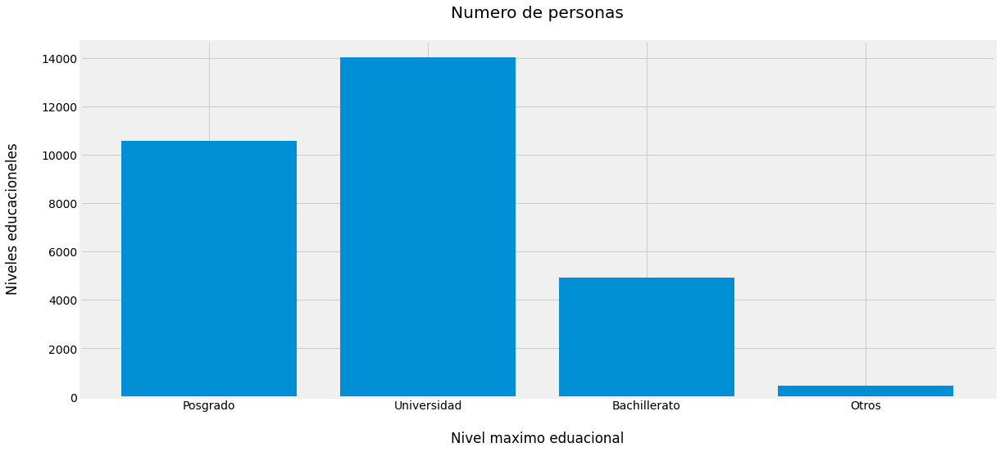

In [125]:
plt.figure(figsize=(20,8))
with plt.style.context('fivethirtyeight'):
  plt.bar(df.EDUCATION.value_counts().index, df.EDUCATION.value_counts().values)

  plt.xlabel('\nNivel maximo eduacional')
  plt.ylabel('Niveles educacioneles\n')
  plt.title('Numero de personas\n')
  plt.xticks([1,2,3,4],["Posgrado","Universidad","Bachillerato","Otros"])
  plt.show()

In [126]:
aux = (df.MARRIAGE == 0)
df.loc[aux,"MARRIAGE"] = 3
print(df.MARRIAGE.value_counts().sort_index())

1    13659
2    15964
3      377
Name: MARRIAGE, dtype: int64


In [127]:
moda_MARRIAGE,frecuencia_MARRIAGE = stats.mode(df['MARRIAGE'])
print('Moda estado civil: '+str(moda_MARRIAGE[0]).replace("1","Casado").replace("2","Soltero").replace("3","Otros")
+' , frecuencia: '+str(frecuencia_MARRIAGE[0]))

Moda estado civil: Soltero , frecuencia: 15964


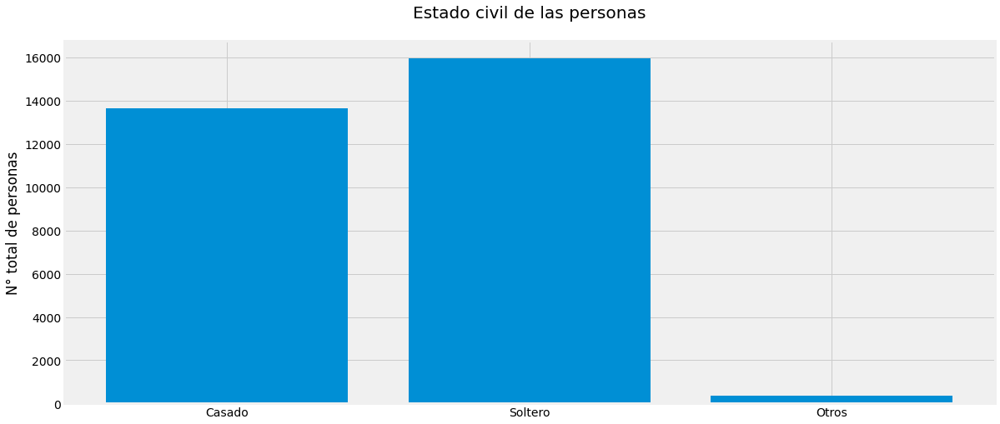

In [128]:
plt.figure(figsize=(20,8))
with plt.style.context('fivethirtyeight'):
  plt.bar(df.MARRIAGE.value_counts().index, df.MARRIAGE.value_counts().values)

  plt.ylabel('N° total de personas')
  plt.title('Estado civil de las personas\n')
  plt.xticks([1,2,3],["Casado","Soltero","Otros"])

  plt.show()

In [129]:
moda_SEX,frecuencia_SEX = stats.mode(df['SEX'])
print('Moda sexo: '+str(moda_SEX[0]).replace("1","Masculino").replace("2","Femenino")
+' , frecuencia: '+str(frecuencia_SEX[0]))

Moda sexo: Femenino , frecuencia: 18112


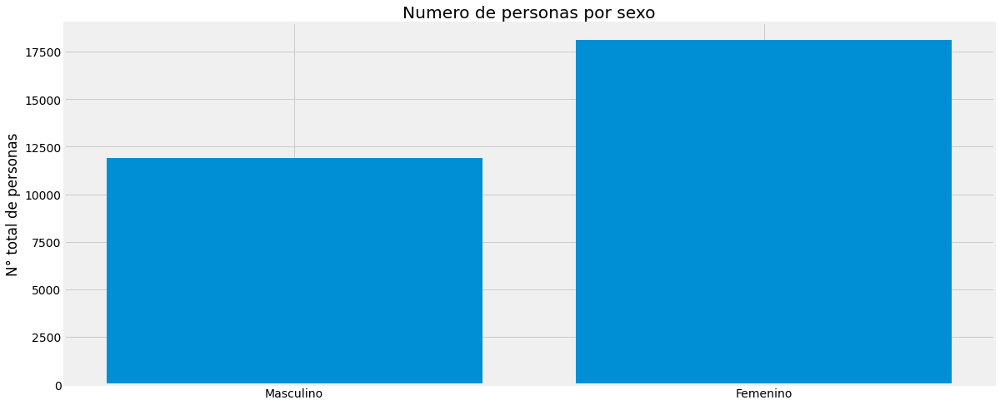

In [130]:
plt.figure(figsize=(20,8))
with plt.style.context('fivethirtyeight'):
  plt.bar(df.SEX.value_counts().index, df.SEX.value_counts().values)

  plt.ylabel('N° total de personas')
  plt.title('Numero de personas por sexo')
  plt.xticks([1,2],["Masculino","Femenino"])
  plt.show()

In [131]:
moda_AGE,frecuencia_AGE = stats.mode(df['AGE'])
print('Moda edad: '+str(moda_AGE[0])+' , frecuencia: '+str(frecuencia_AGE[0]))

Moda edad: 29 , frecuencia: 1605


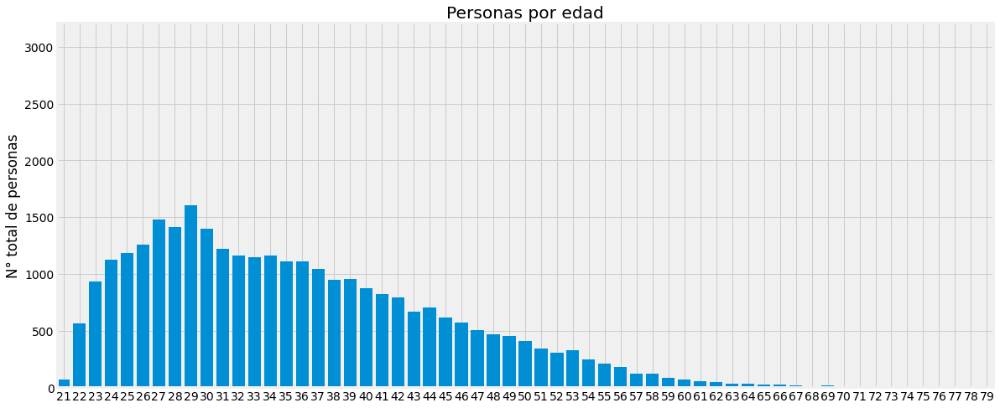

In [132]:
plt.figure(figsize=(20,8))
with plt.style.context('fivethirtyeight'):
  plt.bar(df.AGE.value_counts().index, df.AGE.value_counts().values)

  plt.ylabel('Edades')
  plt.ylabel('N° total de personas')
  plt.title('Personas por edad')
  plt.xticks(np.arange(20,80,step=1))
  plt.margins(0,1)

  plt.show()

* Coef. correlación

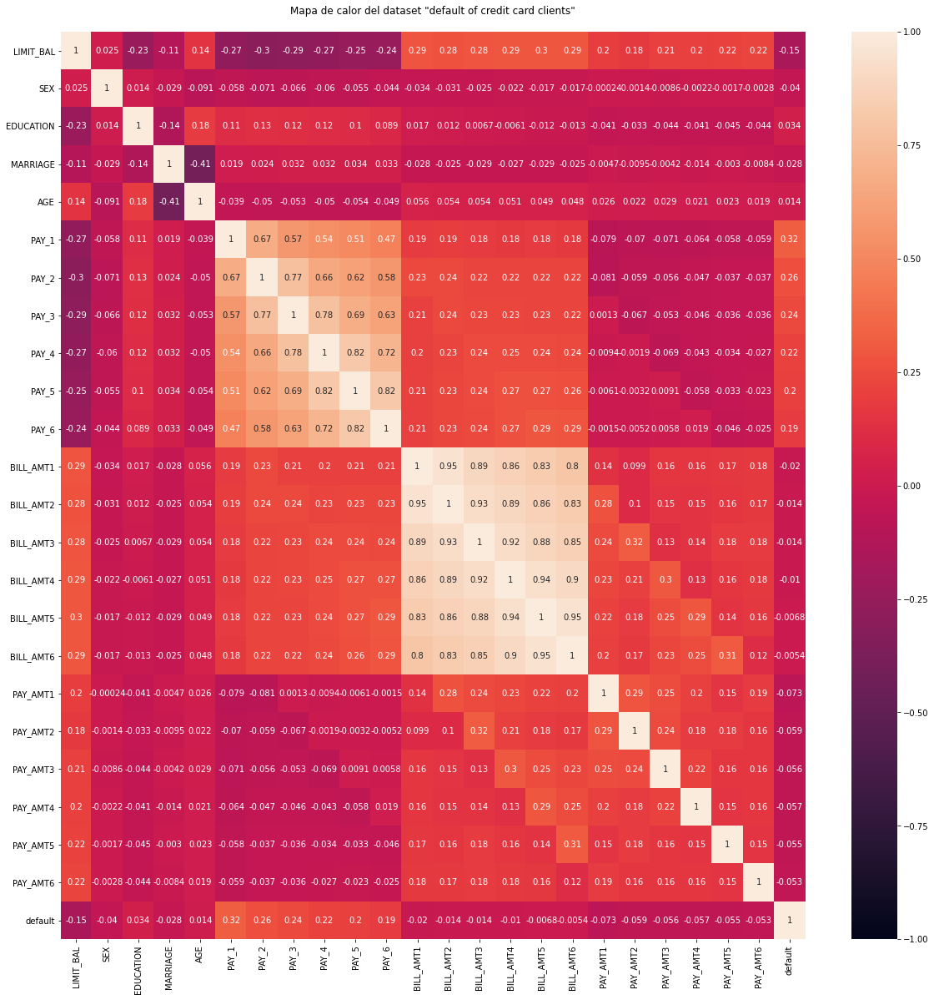

In [133]:
plt.figure(figsize=(20,20))
g = df.corr(method='pearson')
sns.heatmap(g, annot = True, vmin=-1, vmax=1)
plt.title("Mapa de calor del dataset \"default of credit card clients\"\n")
plt.show()

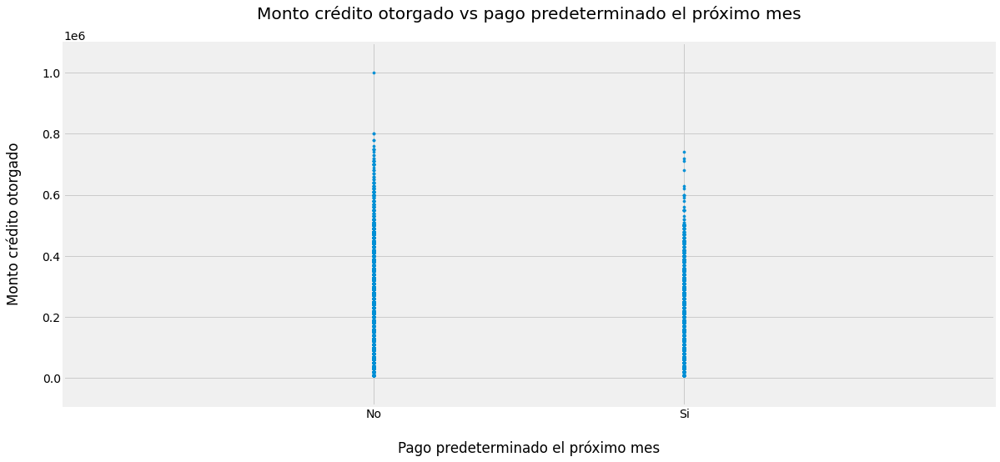

In [134]:
plt.figure(figsize=(20,8))

with plt.style.context('fivethirtyeight'):
  plt.scatter(df.default , df.LIMIT_BAL, s=10)

  plt.xlabel('\nPago predeterminado el próximo mes')
  plt.ylabel('Monto crédito otorgado\n')
  plt.title('Monto crédito otorgado vs pago predeterminado el próximo mes\n')
  plt.xticks([0,1],["No","Si"])
  plt.margins(1,0.1)

  plt.show()

* Diagrama de dispersión

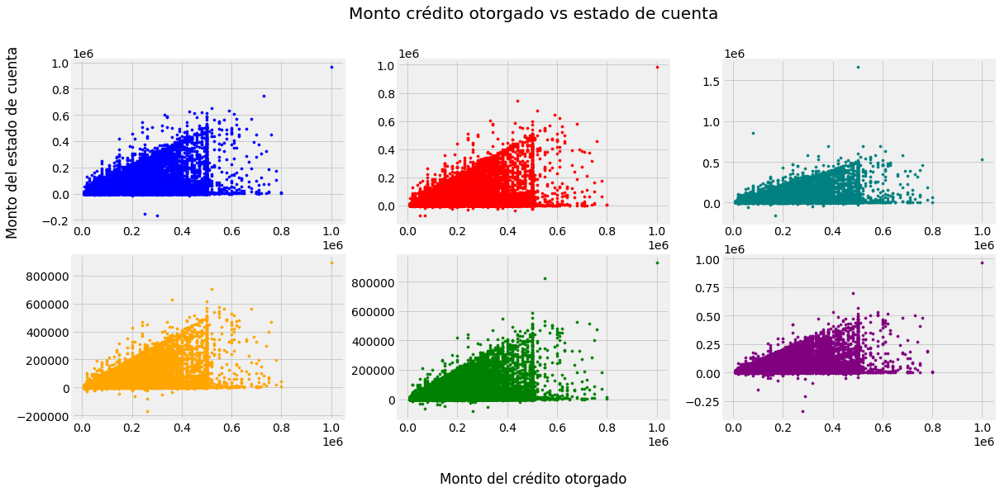

In [135]:
plt.figure(figsize=(20,8))
with plt.style.context('fivethirtyeight'):

  plt.subplot(231)
  plt.ylabel('Monto del estado de cuenta\n')
  plt.scatter(df.LIMIT_BAL, df.BILL_AMT1, color="blue" , s=10)

  plt.subplot(232)
  plt.title('Monto crédito otorgado vs estado de cuenta\n\n')
  plt.scatter(df.LIMIT_BAL, df.BILL_AMT2, color="red" , s=10)

  plt.subplot(233)
  plt.scatter(df.LIMIT_BAL, df.BILL_AMT3, color="teal" , s=10)
 
  plt.subplot(234)
  plt.scatter(df.LIMIT_BAL, df.BILL_AMT4, color="orange", s=10 )

  plt.subplot(235)
  plt.xlabel('\n\nMonto del crédito otorgado')
  plt.scatter(df.LIMIT_BAL, df.BILL_AMT5, color="green", s=10 )

  plt.subplot(236)
  plt.scatter(df.LIMIT_BAL, df.BILL_AMT6, color="purple", s=10 )

  plt.show()

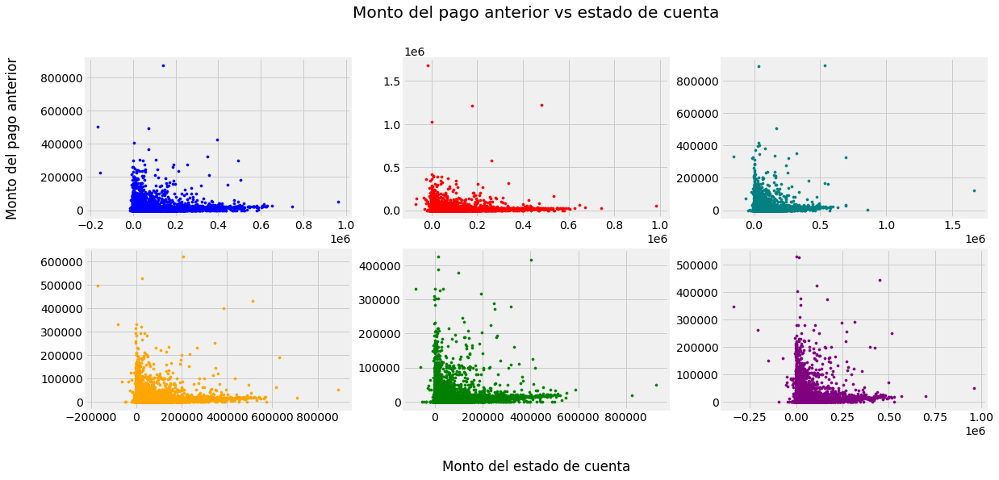

In [136]:
plt.figure(figsize=(20,8))
with plt.style.context('fivethirtyeight'):

  
  plt.subplot(231)
  plt.ylabel('Monto del pago anterior\n')
  plt.scatter(df.BILL_AMT1,df.PAY_AMT1, color="blue" , s=10)

  plt.subplot(232)
  plt.title('Monto del pago anterior vs estado de cuenta\n\n')
  plt.scatter(df.BILL_AMT2,df.PAY_AMT2, color="red" , s=10)

  plt.subplot(233)
  plt.scatter(df.BILL_AMT3,df.PAY_AMT3, color="teal" , s=10)
 
  plt.subplot(234)
  plt.scatter(df.BILL_AMT4,df.PAY_AMT4, color="orange", s=10 )

  plt.subplot(235)
  plt.xlabel('\n\nMonto del estado de cuenta')
  plt.scatter(df.BILL_AMT5,df.PAY_AMT5, color="green", s=10 )

  plt.subplot(236)
  plt.scatter(df.BILL_AMT6,df.PAY_AMT6, color="purple", s=10 )

  plt.show()

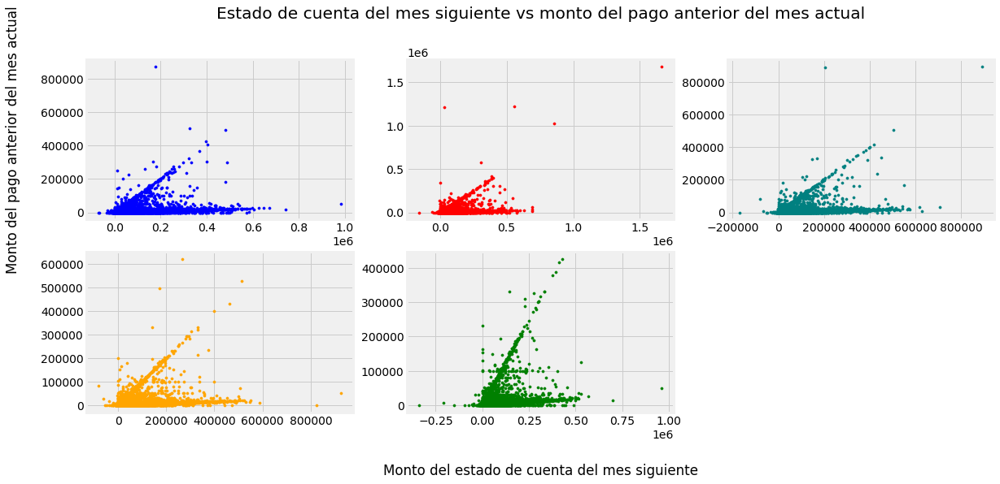

In [137]:
plt.figure(figsize=(20,8))
with plt.style.context('fivethirtyeight'):
  plt.subplot(231)
  plt.ylabel('Monto del pago anterior del mes actual\n')
  plt.scatter(df.BILL_AMT2,df.PAY_AMT1, color="blue" , s=10)

  plt.subplot(232)
  plt.title('Estado de cuenta del mes siguiente vs monto del pago anterior del mes actual\n\n')
  plt.scatter(df.BILL_AMT3,df.PAY_AMT2, color="red" , s=10)

  plt.subplot(233)
  plt.scatter(df.BILL_AMT4,df.PAY_AMT3, color="teal" , s=10)
 
  plt.subplot(234)
  plt.scatter(df.BILL_AMT5,df.PAY_AMT4, color="orange", s=10 )

  plt.subplot(235)
  plt.xlabel('\n\nMonto del estado de cuenta del mes siguiente')
  plt.scatter(df.BILL_AMT6,df.PAY_AMT5, color="green", s=10 )

  plt.show()

# Predicción de los datos


In [138]:
print("Revisamos la informacion que tenemos hasta ahora:\n")
df.head().T

Revisamos la informacion que tenemos hasta ahora:



,0,1,2,3,4
LIMIT_BAL,20000,120000,90000,50000,50000
SEX,2,2,2,2,1
EDUCATION,2,2,2,2,2
MARRIAGE,1,2,2,1,1
AGE,24,26,34,37,57
PAY_1,2,-1,0,0,-1
PAY_2,2,2,0,0,0
PAY_3,-1,0,0,0,-1
PAY_4,-1,0,0,0,0
PAY_5,-2,0,0,0,0


In [139]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import train_test_split
from sklearn import metrics 

#Preparamos las características independientes y la variable objetivo
características = ["MARRIAGE", "AGE", "SEX", "EDUCATION"]
x = df[características]
y = df.default

In [140]:
#Preparamos los datos de entrenamiento (x_t1, y_t1) y los datasets de prueba (x_t2, y_t2)

x_t1, x_t2, y_t1, y_t2 = train_test_split(x, y, test_size=0.3, random_state=1)


cl = DecisionTreeClassifier()

# Train Decision Tree Classifer
cl = cl.fit(x_t1,y_t1)

# Predecimos la respuesta para el dataset de prueba
y_pred = cl.predict(x_t2)


print("Precision:",metrics.accuracy_score(y_t2, y_pred))


Precision: 0.7752222222222223


In [141]:
from sklearn.tree import export_graphviz
#from sklearn.externals.six import StringIO  
from six import StringIO

from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(cl, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = características,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('debit_card.png')
print("Construimos el arbol inicial:\n")
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.748977 to fit

Construimos el arbol inicial:

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.748977 to fit



In [142]:
#Optimizamos los datos para el nuevo arbol

# Creamos un clasificador con un limite de densidad
cl2 = DecisionTreeClassifier(criterion="entropy", max_depth=10)

# Train Decision Tree Classifer
cl2 = cl2.fit(x_t1,y_t1)

# Predecimos la respuesta para el dataset de prueba
y_pred = cl2.predict(x_t2)

print("Accuracy:",metrics.accuracy_score(y_t2, y_pred))

Accuracy: 0.7761111111111111


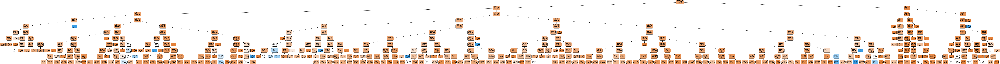

In [143]:
#from sklearn.externals.six import StringIO  
from six import StringIO

from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(cl2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = características,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('debit_card2.png')
Image(graph.create_png())

## Naive Bayes

In [144]:
from sklearn.model_selection import train_test_split

# X Son todas las variables independientes (Sexo,Genero,Educacion,Edad,estado de cuenta,Pagos).
# Y es la variable dependiente.
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

#Creamos las variables de entrenamineto
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [145]:
# Normalizamos

from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()
X_train = mms.fit_transform(X_train)
X_test = mms.transform(X_test)
print(X_test)

[[1.26582278e-02 0.00000000e+00 0.00000000e+00 ... 2.57648953e-03
  0.00000000e+00 1.22167989e-03]
 [1.26582278e-02 1.00000000e+00 3.33333333e-01 ... 0.00000000e+00
  2.57684805e-03 0.00000000e+00]
 [2.78481013e-01 1.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [8.86075949e-02 0.00000000e+00 6.66666667e-01 ... 2.41545894e-03
  3.55605031e-04 1.11924089e-04]
 [1.26582278e-02 0.00000000e+00 3.33333333e-01 ... 0.00000000e+00
  5.15369610e-03 0.00000000e+00]
 [5.06329114e-02 0.00000000e+00 3.33333333e-01 ... 8.48631240e-03
  7.25125042e-03 5.85989001e-03]]


In [146]:
# Entrenamos

from sklearn import naive_bayes
model = naive_bayes.BernoulliNB(binarize=0.5)
model.fit(X_train, y_train)
print(model)

BernoulliNB(binarize=0.5)


In [147]:
# Predecimos

expected_y  = y_test
predicted_y = model.predict(X_test)

In [148]:
# Resultados
MatrizC = metrics.confusion_matrix(expected_y, predicted_y)
print(MatrizC)
print(metrics.accuracy_score(expected_y, predicted_y))

[[4671   32]
 [1210   87]]
0.793


## Datos Graficados de Matriz de Confusion, Accuracy, Precision, Recall y F1 score

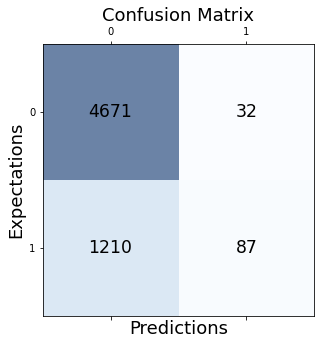

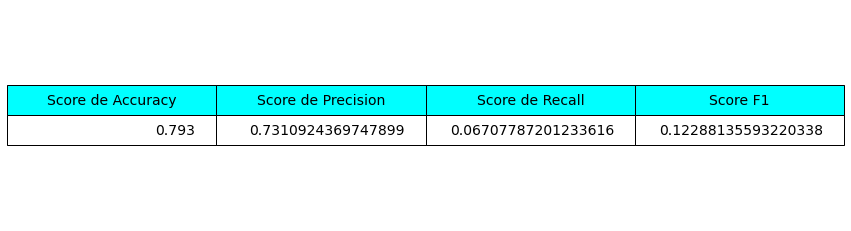

In [149]:
# Retomamos los datos de la Matriz de Confusion
fig, ax = plt.subplots(figsize=(5, 5))
ax.matshow(MatrizC, cmap=plt.cm.Blues, alpha=0.6)
for i in range(MatrizC.shape[0]):
    for j in range(MatrizC.shape[1]):
        ax.text(x=j, y=i,s=MatrizC[i, j], va='center', ha='center', size='xx-large')
 
plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Expectations', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()



fig, ax =plt.subplots(1,1)
data=[[metrics.accuracy_score(expected_y, predicted_y), metrics.precision_score(expected_y, predicted_y), metrics.recall_score(expected_y, predicted_y), metrics.f1_score(expected_y, predicted_y)]]
labels=["Score de Accuracy", "Score de Precision", "Score de Recall", "Score F1" ]
ax.axis('tight')
ax.axis('off')
Tabla = ax.table(cellText=data,
        colLabels=labels, 
        colColours =["cyan"] * 4,
        loc="center")
Tabla.auto_set_font_size(False)
Tabla.set_fontsize(14)
Tabla.scale(2.5, 2.5)
plt.show()


# Random Forest con cross validation

In [150]:
#Random Forest
from sklearn.ensemble import RandomForestClassifier

#one hot
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

# Grid cross-validation
from sklearn.model_selection import cross_val_score ## falta
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ParameterGrid
from sklearn.inspection import permutation_importance ### falta


# Metricas
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report

# multiprocesamiento
import multiprocessing

### Se creara una copia del dataframe debido a que tenemos que transformar una columna del dataframe original

In [151]:
dfRF = df.copy(deep=True)


### Transformamos la columna EDUCATION EN  categorica  para visualizar de mejor manera el dataset


In [152]:
aux = (dfRF.EDUCATION == 1) 
dfRF.loc[aux, "EDUCATION"] = "Posgrado"
aux = (dfRF.EDUCATION == 2) 
dfRF.loc[aux, "EDUCATION"] = "Universidad"

aux = (dfRF.EDUCATION == 3) 
dfRF.loc[aux, "EDUCATION"] = "Bachillerato"

aux = (dfRF.EDUCATION == 4) 
dfRF.loc[aux, "EDUCATION"] = "Otros"

dfRF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   LIMIT_BAL  30000 non-null  int64 
 1   SEX        30000 non-null  int64 
 2   EDUCATION  30000 non-null  object
 3   MARRIAGE   30000 non-null  int64 
 4   AGE        30000 non-null  int64 
 5   PAY_1      30000 non-null  int64 
 6   PAY_2      30000 non-null  int64 
 7   PAY_3      30000 non-null  int64 
 8   PAY_4      30000 non-null  int64 
 9   PAY_5      30000 non-null  int64 
 10  PAY_6      30000 non-null  int64 
 11  BILL_AMT1  30000 non-null  int64 
 12  BILL_AMT2  30000 non-null  int64 
 13  BILL_AMT3  30000 non-null  int64 
 14  BILL_AMT4  30000 non-null  int64 
 15  BILL_AMT5  30000 non-null  int64 
 16  BILL_AMT6  30000 non-null  int64 
 17  PAY_AMT1   30000 non-null  int64 
 18  PAY_AMT2   30000 non-null  int64 
 19  PAY_AMT3   30000 non-null  int64 
 20  PAY_AMT4   30000 non-null  i

## Ajuste del modelo y optimización de hiperparámetros


Se ajusta un árbol aleatorio de clasificación empleando como variable respuesta default y como predictores todas las variables disponibles. Se utilizan en primer lugar los hiperparámetros n_estimator 10, 15, 20 y criterion gini y entropia, el resto se dejan por defecto. 

A diferencia del dataframe antes de modificar, en estos datos la columna EDUCATION es categórica y las demás son int64 por lo que, antes de entrenar el modelo, es necesario aplicar one-hot-encoding, de esta forma nuestro nuevo dataset constara de una transformación de la columna EDUCATION y de un casting de los valores numericos de las demás columnas.

In [153]:
X_train, X_test, y_train, y_test = train_test_split(
                                        dfRF.drop(columns = 'default'),
                                        dfRF['default'],
                                        random_state = 123
                                    )
print(X_train.shape, X_test.shape)

X_train

(22500, 23) (7500, 23)


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
16095,140000,2,Universidad,1,36,1,2,3,2,0,...,61459,59798,61287,8383,5200,0,0,3009,1000,94000
28548,210000,2,Universidad,2,33,0,0,0,-2,-2,...,0,0,0,0,1000,0,0,0,0,0
25096,20000,1,Bachillerato,2,53,-1,0,-1,-1,-1,...,390,18280,2880,1600,1105,390,18280,2880,1600,0
12260,90000,2,Universidad,2,23,2,4,4,3,4,...,37825,40299,39093,38167,2000,0,3400,0,0,1000
21549,50000,2,Bachillerato,2,22,-2,-2,-2,-2,-2,...,1697,0,0,5000,0,1699,0,0,5000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28636,380000,2,Universidad,1,37,0,0,0,0,0,...,13277,14291,15949,15556,1204,1300,1242,1900,0,3000
17730,360000,2,Posgrado,1,54,1,-2,-2,-1,0,...,0,2580,2580,6941,0,0,2580,0,6941,0
28030,50000,2,Bachillerato,1,29,0,0,0,0,0,...,46777,39420,8824,9009,2002,2000,1530,1000,327,329
15725,30000,2,Universidad,2,21,0,0,0,0,0,...,29435,30841,29434,16565,2000,2000,2000,1765,331,0


In [154]:
# One hot encoding de las variable categórica EDUCATION


# Se identifica el nobre de las columnas numéricas y la unica categorica
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.to_list()
print(cat_cols)

numeric_cols = X_train.select_dtypes(include=['float64', 'int']).columns.to_list()
print(numeric_cols)

# Se aplica one-hot-encoding solo a las columna EDUCATION
preprocessor = ColumnTransformer(
                    [('onehot', OneHotEncoder(handle_unknown='ignore'), cat_cols)],
                    remainder='passthrough'
               )
# Una vez que se ha definido el objeto ColumnTransformer, con el método fit()
# se aprenden las transformaciones con los datos de entrenamiento y se aplican a
# los dos conjuntos con transform(). Ambas operaciones a la vez con fit_transform().
X_train_prep = preprocessor.fit_transform(X_train)
X_test_prep  = preprocessor.transform(X_test)

['EDUCATION']
['LIMIT_BAL', 'SEX', 'MARRIAGE', 'AGE', 'PAY_1', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']


In [155]:
# Convertir el output del ColumnTransformer en dataframe y añadir nombre columnas

# Nombre de todas las columnas
encoded_cat = preprocessor.named_transformers_['onehot'].get_feature_names(cat_cols)
labels = np.concatenate([numeric_cols, encoded_cat])

# Conversión a dataframe
X_train_prep = pd.DataFrame(X_train_prep, columns=labels)
X_test_prep  = pd.DataFrame(X_test_prep, columns=labels)

X_train_prep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22500 entries, 0 to 22499
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   LIMIT_BAL               22500 non-null  float64
 1   SEX                     22500 non-null  float64
 2   MARRIAGE                22500 non-null  float64
 3   AGE                     22500 non-null  float64
 4   PAY_1                   22500 non-null  float64
 5   PAY_2                   22500 non-null  float64
 6   PAY_3                   22500 non-null  float64
 7   PAY_4                   22500 non-null  float64
 8   PAY_5                   22500 non-null  float64
 9   PAY_6                   22500 non-null  float64
 10  BILL_AMT1               22500 non-null  float64
 11  BILL_AMT2               22500 non-null  float64
 12  BILL_AMT3               22500 non-null  float64
 13  BILL_AMT4               22500 non-null  float64
 14  BILL_AMT5               22500 non-null

### Ahora contamos con 4 nuevas columnas creadas a partir del metodo one hot encoding y las demás columnas de tipo float64

In [156]:
# Grid de hiperparámetros evaluados

# Los parametros de param_grid pueden ser ampliamente modificados para obtener mayor rendimiento pero en ocaciones
# el tiempo computacional crece considerablemente incluso en algunos casos durando más de 15 minutos en entrenamiento
# sin embargo para terminos de este trabajo se busco una configuración que durara el tiempo minimo posible sin perder tanta calidad en la clasificación
# aproximadamente dura de 1 minuto a 50 segundos
# Si bien se re entrenara el modelo con los hiperparametros más optimos esto puede mejorar más segun los hiperparametros iniciales disponibles

param_grid = {'n_estimators': [10, 15, 20],
              'max_features': [4, 7, 9],              
              'criterion'   : ['gini', 'entropy']
             }

# Búsqueda por grid search con validación cruzada y randomforest con tecnica bootstrapping

grid = GridSearchCV(
        estimator  = RandomForestClassifier(random_state = 123, bootstrap=True),
        param_grid = param_grid,
        scoring    = 'accuracy',
        n_jobs     = multiprocessing.cpu_count() - 1,
        cv         = RepeatedKFold(n_splits=5, n_repeats=3, random_state=123), 
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid.fit(X = X_train_prep, y = y_train)

# Resultados

resultados = pd.DataFrame(grid.cv_results_)
res = resultados.filter(regex = '(param*|mean_t|std_t)').drop(columns = 'params').sort_values('mean_test_score', ascending = False)
res.head(4)

,param_criterion,param_max_features,param_n_estimators,mean_test_score,std_test_score,mean_train_score,std_train_score
17,entropy,9,20,0.812281,0.005089,0.992707,0.000649
14,entropy,7,20,0.810889,0.004796,0.992696,0.000611
5,gini,7,20,0.810459,0.005091,0.992867,0.000761
11,entropy,4,20,0.810119,0.004673,0.992800,0.000771


In [157]:
# Mejores hiperparámetros por validación cruzada

print("Mejores hiperparámetros encontrados (cross validation)")

print(grid.best_params_, ":", grid.best_score_, grid.scoring)

Mejores hiperparámetros encontrados (cross validation)
{'criterion': 'entropy', 'max_features': 9, 'n_estimators': 20} : 0.8122814814814814 accuracy


## Mejores hiperparámetros encontrados (cross validation)

Una vez identificados los mejores hiperparámetros, se reentrena el modelo indicando los valores óptimos en sus argumentos. Si en el GridSearchCV() se indica refit=True, este reentrenamiento se hace automáticamente y el modelo resultante se encuentra almacenado en .best_estimator_.-

In [158]:
# Guardamos el modelo más optimo segun los hiperparametros
modelo_final_Random_Forest_CV = grid.best_estimator_

## Predicción y evaluación del modelo

Por último, se evaluara la capacidad predictiva del modelo final utilizando el conjunto de test

In [159]:
#
predicciones_Random_Forest = modelo_final_Random_Forest_CV.predict(X = X_test_prep)
predicciones_Random_Forest[:20]

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0])

In [160]:
matriz_confusion = confusion_matrix(
                    y_true    = y_test,
                    y_pred    = predicciones_Random_Forest
                )

accuracy = accuracy_score(
            y_true    = y_test,
            y_pred    = predicciones_Random_Forest,
            normalize = True
           )

print("Matriz de confusión test")

print(matriz_confusion)
print()
print("El accuracy de test es:", (100 * accuracy), "%")

Matriz de confusión test
[[5502  371]
 [1054  573]]

El accuracy de test es: 81.0 %


### Reporte completo de clasificación utilizando Random Forest Cross-Validation

In [161]:
reporte_clasificacion_Random_forest= classification_report(
        y_true = y_test,
        y_pred = predicciones_Random_Forest
    )
    
print(reporte_clasificacion_Random_forest)    

              precision    recall  f1-score   support

           0       0.84      0.94      0.89      5873
           1       0.61      0.35      0.45      1627

    accuracy                           0.81      7500
   macro avg       0.72      0.64      0.67      7500
weighted avg       0.79      0.81      0.79      7500



### ploteamos matriz de confusion generada con Random Forest Cross-Validation

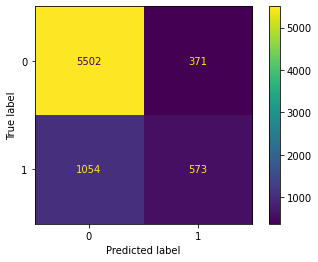

In [162]:
plot_confusion_matrix(grid, X=X_test_prep, y_true=y_test)
plt.show()  

# **STree**
Oblique Tree classifier based on SVM nodes

In [163]:
# pip install git+https://github.com/doctorado-ml/stree #Libreria

In [164]:
# Librerias
import time
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from stree import Stree
from sklearn.preprocessing import RobustScaler

In [165]:
# Normalizamos 
X_pre = RobustScaler().fit_transform( X.values )

In [166]:
# modelo Stree
stree = Stree(random_state=2020, C=.01, max_iter=1e3)

In [167]:
# Generamos las variables de entrenamiento y testing
Xtrain, Xtest, ytrain, ytest = train_test_split(X_pre, y, train_size=.7, shuffle=True, random_state=2020, stratify=y)

In [168]:
# Entrenamos
def try_model(model):
    
    now = time.time()
    model.fit(Xtrain, ytrain)
    spent = time.time() - now
    
    predict = model.predict(Xtrain)
    predictt = model.predict(Xtest)
    print(f"\n\n************************** Stree **********************")
    print(f"Train Model Stree took: {spent:.4} seconds")
    print(f"=========== Stree - Train {Xtrain.shape[0]:,} samples =============",)
    print(classification_report(ytrain, predict, digits=6))
    print(f"=========== Stree - Test {Xtest.shape[0]:,} samples =============")
    print(classification_report(ytest, predictt, digits=6))
    print("Confusion Matrix in Train")
    print(confusion_matrix(ytrain, predict))
    print("Confusion Matrix in Test")
    print(confusion_matrix(ytest, predictt))
    print(f"*******************************************************\n\n")
    return f1_score(ytest, predictt), spent

In [169]:
# Llamada a la función para el entrenemiento y testing
f1, time_spent = try_model(stree)

/home/javier/anaconda3/envs/machinelearningtensor1/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/home/javier/anaconda3/envs/machinelearningtensor1/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/home/javier/anaconda3/envs/machinelearningtensor1/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  % self.max_iter, ConvergenceWarning)
/home/javier/anaconda3/envs/machinelearningtensor1/lib/python3.7/site-packages/sklearn/svm/_base.py:258: ConvergenceWarning: Solver terminated early (max_iter=1000).  Co



************************** Stree **********************
Train Model Stree took: 24.63 seconds
=========== Stree - Train 21,000 samples =============
              precision    recall  f1-score   support

           0   0.831356  0.942525  0.883457     16355
           1   0.617575  0.326803  0.427425      4645

    accuracy                       0.806333     21000
   macro avg   0.724466  0.634664  0.655441     21000
weighted avg   0.784070  0.806333  0.782587     21000

=========== Stree - Test 9,000 samples =============
              precision    recall  f1-score   support

           0   0.830073  0.944357  0.883535      7009
           1   0.619883  0.319437  0.421611      1991

    accuracy                       0.806111      9000
   macro avg   0.724978  0.631897  0.652573      9000
weighted avg   0.783574  0.806111  0.781347      9000

Confusion Matrix in Train
[[15415   940]
 [ 3127  1518]]
Confusion Matrix in Test
[[6619  390]
 [1355  636]]
*********************************

In [170]:
print(f"Model:     Stree \t Tiempo: {time_spent:6.2f} Segundos\t f1: {f1}")

Model:     Stree 	 Tiempo:  24.63 Segundos	 f1: 0.421610871726881
